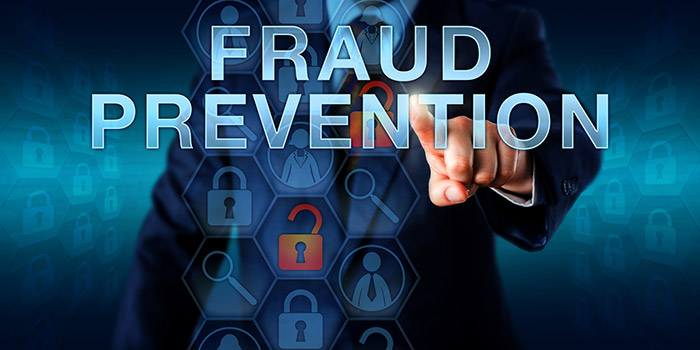
Imagine standing at the check-out counter at the grocery store with a long line behind you and the cashier not-so-quietly announces that your card has been declined. In this moment, you probably aren’t thinking about the data science that determined your fate.

Embarrassed, and certain you have the funds to cover everything needed for an epic nacho party for 50 of your closest friends, you try your card again. Same result. As you step aside and allow the cashier to tend to the next customer, you receive a text message from your bank. “Press 1 if you really tried to spend $500 on cheddar cheese.”

While perhaps cumbersome (and often embarrassing) in the moment, this fraud prevention system is actually saving consumers millions of dollars per year. Researchers from the IEEE Computational Intelligence Society (IEEE-CIS) want to improve this figure, while also improving the customer experience. With higher accuracy fraud detection, you can get on with your chips without the hassle.

The data comes from [Vesta's](https://www.vesta.io/) real-world e-commerce transactions and contains a wide range of features from device type to product features. For each TransactionID in the test set, one must predict a probability for the isFraud variable

https://www.kaggle.com/competitions/ieee-fraud-detection

### Dataset Description
you are predicting the probability that an online transaction is fraudulent, as denoted by the binary target isFraud.

The data is broken into two files identity and transaction, which are joined by TransactionID. Not all transactions have corresponding identity information.

#### Transaction Table

Contains money transfer and also other gifting goods and service, like you booked a ticket for others, etc
* TransactionDT: timedelta from a given reference datetime (not an actual timestamp) 
* TransactionAMT: transaction payment amount in USD
* ProductCD: Product code, the product for each transaction
* card1 - card6: payment card information, such as card type, card category, issue bank, country, etc.
* addr1, addr2: address
* dist: distances between (not limited) billing address, mailing address, zip code, IP address, phone area, etc.
* P_ and (R__) emaildomain: purchaser and recipient email domain
* C1-C14: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
* D1-D15: timedelta, such as days between previous transaction, etc.
* M1 - M9: match, such as names on card and address, etc.
* Vxxx: Vesta engineered rich features, including ranking, counting, and other entity relations.
** For example, how many times the payment card associated with a IP and email or address appeared in 24 hours time range, etc. All Vesta features were derived as numerical. some of them are count of orders within a clustering, a time-period or condition, so the value is finite and has ordering (or ranking). I wouldn't recommend to treat any of them as categorical. If any of them resulted in binary by chance, it maybe worth trying.

Categorical Features:
* ProductCD
* card1 - card6
* addr1, addr2
* P_emaildomain
* R_emaildomain
* M1 - M9

##### Identity Table
Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.
They're collected by Vesta’s fraud protection system and digital security partners.
(The field names are masked and pairwise dictionary will not be provided for privacy protection and contract agreement)

Categorical Features:
* DeviceType
* DeviceInfo
* id_12 - id_38

https://www.kaggle.com/competitions/ieee-fraud-detection/discussion/101203

### Outcome

A model that predicts the probability that an online transaction is fraudulent or not, as denoted by the binary target isFraud.

In [1]:
%matplotlib inline
import sys
import pandas as pd
import numpy as np
from scipy import stats

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from os.path import join

# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html#sklearn.metrics.roc_auc_score
from sklearn.metrics import roc_auc_score

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV

from sklearn.ensemble import RandomForestClassifier, IsolationForest
import lightgbm as lgb


from datetime import datetime, timedelta

from sklearn.preprocessing import LabelEncoder

In [2]:
pd.options.display.max_rows = 10000
pd.options.display.max_columns = 10000

### Helper functions

In [3]:
def get_null_percentage(df):
    """
    Returns Pandas series
    """
    return df.isnull().sum()*100/df.shape[0]

def remove_outliers(df, lower_value, upper_value, col_name):
    intial_num_rows = df.shape[0]
    df = df[(df[col_name] >= lower_value) & (df[col_name] <= upper_value)]
    print(f"percent of records with {col_name} outliers eliminated {(intial_num_rows - df.shape[0])*100 / intial_num_rows}")
    return df

def drop_columns(df, cols_to_drop):
    df.drop(columns=cols_to_drop, inplace=True)
    return df

def get_value_counts_on_col(df, col):
    return df[col].value_counts()

def get_nunique_count(df, col=None):
    if not col:
        return df.nunique()
    else:
        return df[col].nunique()

def get_columns(df):
    return list(df.columns)

def count_plot(df, column, title, user_friendly_title, **kwargs):
    if not kwargs:
        kwargs.update({"figsize": [6, 3]})
        
    plt.figure(**kwargs)
    sns.countplot(data = df, y = column, order=df[column].value_counts().index)
    plt.title(title)
    plt.ylabel(user_friendly_title)
    plt.plot()

def get_cols_by_datatype(df, dtypes=None):
    cols_by_dtypes = df.columns.to_series().groupby(df.dtypes).groups
    if not dtypes:
        return cols_by_dtypes
    else:
        return {str(dtype): list(v) for dtype, v in cols_by_dtypes.items() if dtype in dtypes}

def visualize_outliers(df, col):    
    fig, axis = plt.subplots(nrows=1, ncols=3, figsize=[12, 4])
    fig.suptitle(col)
    axis[0].boxplot(df[col])
    axis[1].hist(df[col])
    stats.probplot(df[col], plot=axis[2], dist="norm")
    plt.show()
    

def reduce_memory_footprint(df):
    
    initial_memory_MB = df.memory_usage().sum()/ (1024**2)
    
    for column in df.columns:
        column_type = df[column].dtype
        
        if column_type != object:
            col_min = df[column].min()
            col_max = df[column].max()
            
            if str(column_type)[:3] == 'int':
                if col_min > np.iinfo(np.int8).min and col_max < np.iinfo(np.int8).max:
                    df[column] = df[column].astype(np.int8)
                    
                elif col_min > np.iinfo(np.int16).min and col_max < np.iinfo(np.int16).max:
                    df[column] = df[column].astype(np.int16)
                    
                elif col_min > np.iinfo(np.int32).min and col_max < np.iinfo(np.int32).max:
                    df[column] = df[column].astype(np.int32)
                    
                elif col_min > np.iinfo(np.int64).min and col_max < np.iinfo(np.int64).max:
                    df[column] = df[column].astype(np.int64)
            else:
                if col_min > np.finfo(np.float16).min and col_max < np.finfo(np.float16).max:
                    df[column] = df[column].astype(np.float16)
                    
                elif col_min > np.finfo(np.float32).min and col_max < np.finfo(np.float32).max:
                    df[column] = df[column].astype(np.float32)
                    
                else:
                    df[column] = df[column].astype(np.float64)
        else:
            df[column] = df[column].astype('category')
    
    final_memory_MB = df.memory_usage().sum()/ (1024**2)

    return df

def correlation_with_col(df, base_col):
    numeric_cols = [col for col in df.columns if df[col].dtype != 'object']
    print (f"Numeric columns: {numeric_cols}")
    df_copy = df.copy()
#     correlation_matrix = df_copy[numeric_cols].corrwith(base_col).reset_index().sort_values(0, ascending=False).reset_index(drop=True).rename({'index':'Column',0:'Correlation with ' + col}, axis=1)
    return None
    
# helper function
def get_outliers_visibility(numeric_df, sigma):
    
    # get mean and standard deviation   
    mean, std = np.mean(numeric_df), np.std(numeric_df)
    
    #  set boundary to get higher and lower values based on the mean
    boundary = std * sigma
    
    lower, upper = mean-boundary, mean+boundary
    
    lower_outliers = [x for x in numeric_df if x < lower]
    upper_outliers = [x for x in numeric_df if x > upper]
    
    total_outliers = lower_outliers + upper_outliers
    
    without_outliers = [x for x in numeric_df if x >= lower and x <= upper]
    
    outlier_details = {
        "total_lower_outliers": len(lower_outliers),
        "total_upper_outliers": len(upper_outliers),
        "total_outliers": len(total_outliers),
        "total_datapoints": len(numeric_df),
        "percent_outliers": (len(total_outliers)/ len(numeric_df)) * 100,
        "lower_outlier_datapoints": sorted(lower_outliers),
        "upper_outlier_datapoints": sorted(upper_outliers)
    }
    return outlier_details

def tabualar_info(df, columns = None):
    if columns: 
        df = df[columns]
    print(f"Shape of dataframe: {df.shape}")
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary.rename(columns={'index': 'Name', 'dtypes': 'dtype'}, inplace=True)
    summary['UniqueCount'] = df.nunique().values
    summary['NullValues'] = df.isnull().sum().values
    summary['NullPercent'] = (df.isnull().sum() * 100 / df.shape[0]).values
    return summary

In [4]:
QUANTILE_VALUES = [0.1/100, 1/100, 10/100, 25/1000, 50/100, 75/100, 80/100, 90/100, 99/100, 99.5/100]
NUMERICS = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

In [5]:
!ls ieee-fraud-detection-data/

sample_submission.csv test_transaction.csv  train_transaction.csv
test_identity.csv     train_identity.csv


### Load Training Dataset 

In [6]:
%%time
train_transaction_df = pd.read_csv('ieee-fraud-detection-data/train_transaction.csv')
train_identity_df = pd.read_csv('ieee-fraud-detection-data/train_identity.csv')


CPU times: user 17.1 s, sys: 8.33 s, total: 25.4 s
Wall time: 26.8 s


In [7]:
train_transaction_df.head(2)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [8]:
train_identity_df.head(2)

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device


In [9]:
print(f"Shape of Train Transaction dataframe {train_transaction_df.shape}")
print(f"Shape of Train Identity dataframe {train_identity_df.shape}")

Shape of Train Transaction dataframe (590540, 394)
Shape of Train Identity dataframe (144233, 41)


In [10]:
%%time
train_transaction_df = train_transaction_df.merge(train_identity_df, on='TransactionID', how='left')

CPU times: user 1.13 s, sys: 1.13 s, total: 2.26 s
Wall time: 2.31 s


In [11]:
print(f"Shape of Train Dataset with identity dataframe {train_transaction_df.shape}")

Shape of Train Dataset with identity dataframe (590540, 434)


In [12]:
print(type(train_transaction_df.dtypes))

<class 'pandas.core.series.Series'>


Get Unique count, # of null value and null percent

In [13]:
tabualar_info(train_transaction_df)

Shape of dataframe: (590540, 434)


,Name,dtype,UniqueCount,NullValues,NullPercent
0,TransactionID,int64,590540,0,0.000000
1,isFraud,int64,2,0,0.000000
2,TransactionDT,int64,573349,0,0.000000
3,TransactionAmt,float64,20902,0,0.000000
4,ProductCD,object,5,0,0.000000
5,card1,int64,13553,0,0.000000
6,card2,float64,500,8933,1.512683
7,card3,float64,114,1565,0.265012
8,card4,object,4,1577,0.267044
9,card5,float64,119,4259,0.721204


In [14]:
type(train_identity_df.isnull().sum() * 100 / train_identity_df.shape[0])

pandas.core.series.Series

In [15]:
train_transaction_size_GB = train_transaction_df.memory_usage().sum()/(1024**3)
print(f"Memory Usage {round(train_transaction_size_GB, 4)} GB")

Memory Usage 1.9095 GB


In [16]:
print(f"Memory Usage {round(train_transaction_df.memory_usage().sum()/(1024**2), 4)} MB")
print(f"Shape of Train Identity dataframe {train_transaction_df.shape}")

Memory Usage 1955.3709 MB
Shape of Train Identity dataframe (590540, 434)


In [17]:
# To reduce memory footprint, original identity dataframes are deleted.
del train_identity_df

In [18]:
ORIG_DF_LEN = len(train_transaction_df)

## EDA

Lets under the target data distribution by plotting a count plot

,Count,count,Percentage of data points
0,0,569877,0.0
1,1,20663,1.0


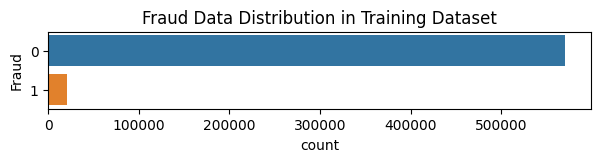

In [19]:
# Plot count plot
count_plot(df=train_transaction_df, column='isFraud', title='Fraud Data Distribution in Training Dataset', \
           user_friendly_title='Fraud', figsize =[7, 1])

val_cnt_df = get_value_counts_on_col(df=train_transaction_df, col='isFraud').reset_index().rename({'index': 'Value', 
                                                                                     'isFraud': 'Count'}, axis=1)

val_cnt_df['Percentage of data points'] = round(val_cnt_df['Count'] / val_cnt_df['Count'].sum(), 4)
val_cnt_df

It can be noted from the above plot that the data is highly imbalanced.

In [20]:
# Lets understand of TransactionAmt distribution
print('Transaction Amount Quantiles')
train_transaction_df['TransactionAmt'].quantile(QUANTILE_VALUES)


Transaction Amount Quantiles


0.001       3.611709
0.010       9.244000
0.100      25.950000
0.025      14.501000
0.500      68.769000
0.750     125.000000
0.800     159.950000
0.900     275.293000
0.990    1104.000000
0.995    1656.110000
Name: TransactionAmt, dtype: float64

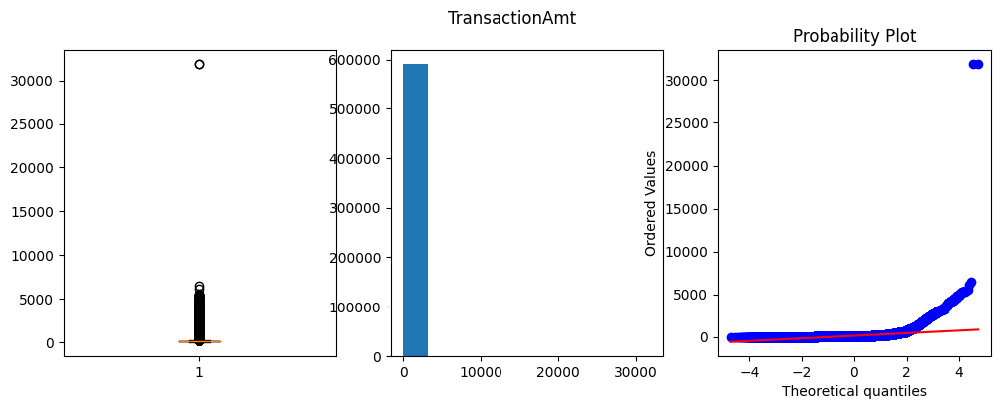

In [21]:

visualize_outliers(df=train_transaction_df, col='TransactionAmt')

Let's under the Fraud and non-Fraud Transaction amount distribution

Text(0.5, 1.0, 'Amount Distribution when Fraud occured')

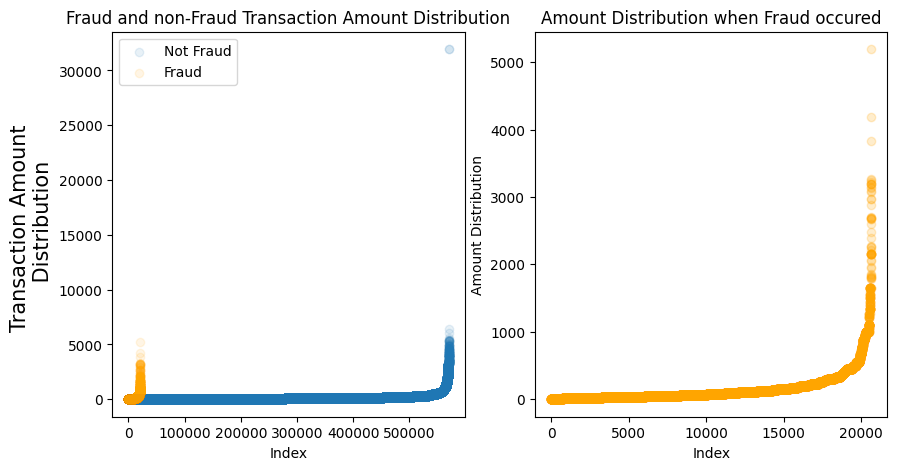

In [22]:
fig, axs = plt.subplots(1,2, squeeze=False, figsize=(10, 5))
axs[0,0].scatter(range(train_transaction_df[train_transaction_df['isFraud'] == 0].shape[0]),
                 np.sort(train_transaction_df[train_transaction_df['isFraud'] == 0]['TransactionAmt'].values), 
                 label='Not Fraud', alpha=.1)

axs[0,0].scatter(range(train_transaction_df[train_transaction_df['isFraud'] == 1].shape[0]),
                 np.sort(train_transaction_df[train_transaction_df['isFraud'] == 1]['TransactionAmt'].values), 
                 label='Fraud', alpha=.1, color='orange')

axs[0,0].set_title('Fraud and non-Fraud Transaction Amount Distribution')
axs[0,0].set_xlabel("Index")
axs[0,0].set_ylabel("Transaction Amount \n Distribution", fontsize=15)
axs[0,0].legend()

axs[0,1].scatter(
    range(train_transaction_df[train_transaction_df['isFraud'] == 1].shape[0]),
         np.sort(train_transaction_df[train_transaction_df['isFraud'] == 1]['TransactionAmt'].values),
         label = 'Fraud', alpha = 0.2, color = 'orange'
)
axs[0,1].set_xlabel('Index')
axs[0,1].set_ylabel('Amount Distribution')
axs[0,1].set_title('Amount Distribution when Fraud occured')



Looks like majority of Fraud instances occured when amount is  less than 1000.. Let's plot distibution chart to understand it better

In [23]:
px.histogram(train_transaction_df[train_transaction_df['TransactionAmt'] <= 1000]['TransactionAmt'], \
                            nbins=50, title="Amount Distribution")

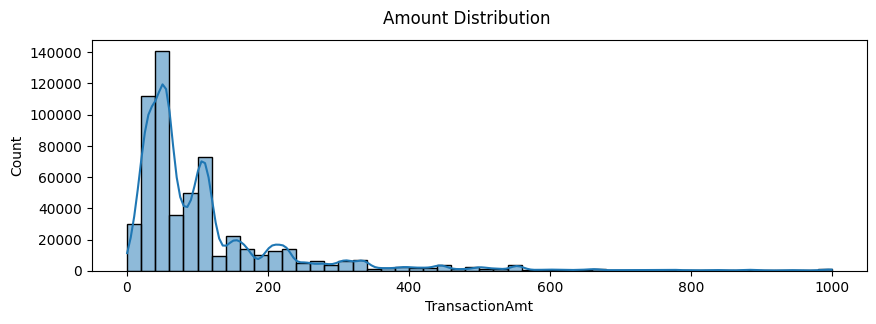

In [24]:
plt.figure(figsize=(10, 3))
plt.suptitle('Amount Distribution')
plt.subplot()
amt_dist_plot = sns.histplot(train_transaction_df[train_transaction_df['TransactionAmt'] <= 1000]['TransactionAmt'], \
                            bins=50, kde=True)

plt.show()


This provides an interesting insight..Let's get similar info using quantiles 

In [25]:
fraud_quantile_df = train_transaction_df[train_transaction_df['isFraud'] == 1]['TransactionAmt'] \
                .quantile(QUANTILE_VALUES)

not_fraud_quantile_df = train_transaction_df[train_transaction_df['isFraud'] == 0]['TransactionAmt'] \
                .quantile(QUANTILE_VALUES)

pd.concat([fraud_quantile_df.reset_index(), not_fraud_quantile_df.reset_index()], axis=1, keys=['Fraud', 'Not Fraud'])


Fraud                Not Fraud               
   index TransactionAmt     index TransactionAmt
0  0.001        0.58300     0.001       3.719636
1  0.010        6.74096     0.010       9.512880
2  0.100       18.93600     0.100      26.310000
3  0.025        9.50740     0.025      15.000000
4  0.500       75.00000     0.500      68.500000
5  0.750      161.00000     0.750     120.000000
6  0.800      201.00000     0.800     159.950000
7  0.900      335.00000     0.900     267.112000
8  0.990      994.00000     0.990    1104.000000
9  0.995     1331.00000     0.995    1679.950000

Let's get visbility into Outliers

In [26]:
def understand_outliers(numeric_df, title, sigma=3):
    outlier_details = get_outliers_visibility(numeric_df, sigma=sigma)
    for k, v in outlier_details.items():
        if 'datapoints' not in k:
            print(f"{k.title().replace('_', ' ')}: {round(v, 4)}")

    upper_outlier_datapoints = outlier_details['upper_outlier_datapoints']
    if upper_outlier_datapoints:
        print(f'First datapoint falling outside of 3 sigma: {upper_outlier_datapoints[0]}')
    else:
        print(f'No outliers')

    plt.figure(figsize=(10, 2))
    sns.histplot(upper_outlier_datapoints, bins=20)
    plt.title(title)
    plt.show()

Total Lower Outliers: 0
Total Upper Outliers: 10093
Total Outliers: 10093
Percent Outliers: 1.7091
First datapoint falling outside of 3 sigma: 852.77


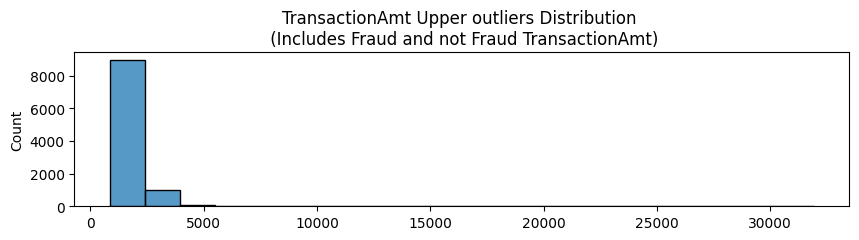

In [27]:
title= "TransactionAmt Upper outliers Distribution \n (Includes Fraud and not Fraud TransactionAmt)"
understand_outliers(train_transaction_df['TransactionAmt'], title=title)

Total Lower Outliers: 0
Total Upper Outliers: 541
Total Outliers: 541
Percent Outliers: 2.6182
First datapoint falling outside of 3 sigma: 849.0


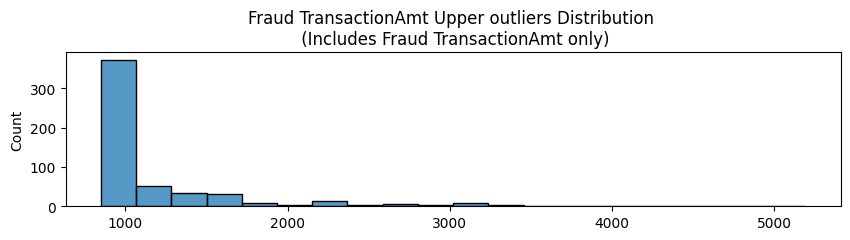

In [28]:
title= "Fraud TransactionAmt Upper outliers Distribution \n (Includes Fraud TransactionAmt only)"
data = train_transaction_df[train_transaction_df['isFraud'] == 1]['TransactionAmt'].values
understand_outliers(data, title=title)

##### Inference
- Total Fraud datapoints: 20663
- Total Fraud outliers datapoints (3 times the mean of TransactionAmt): 541
- total Fraud outlier percent: 2.62


### Let understand product distribution and how fraud frequency by product

In [29]:
# count_plot(df=train_transaction_df, column='ProductCD', title=col, user_friendly_title=col, figsize= [6, 1])

isFraud    Not Fraud      Fraud
ProductCD                      
C          88.312731  11.687269
H          95.233769   4.766231
R          96.217406   3.782594
S          94.100447   5.899553
W          97.960061   2.039939


Text(0.5, 1.0, 'Product CD by Target (IsFraud)')

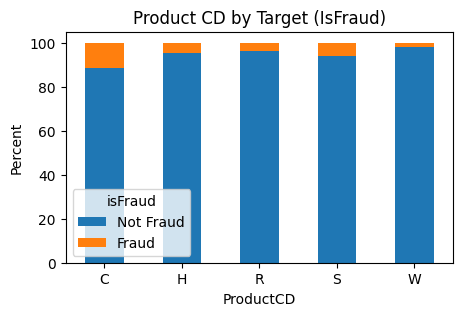

In [30]:
crosstb = pd.crosstab(train_transaction_df['ProductCD'], train_transaction_df['isFraud'], normalize='index')* 100
crosstb.rename(columns={0: "Not Fraud", 1: "Fraud"}, inplace=True)

crosstb = crosstb.sort_values(by='isFraud', axis=1, ascending=False)
print(crosstb)
g = crosstb.plot.bar(rot=0, stacked=True, figsize = (5,3))
g.set_ylabel('Percent')
g.set_xlabel('ProductCD')
g.set_title('Product CD by Target (IsFraud)')

<Axes: xlabel='ProductCD', ylabel='TransactionAmt'>

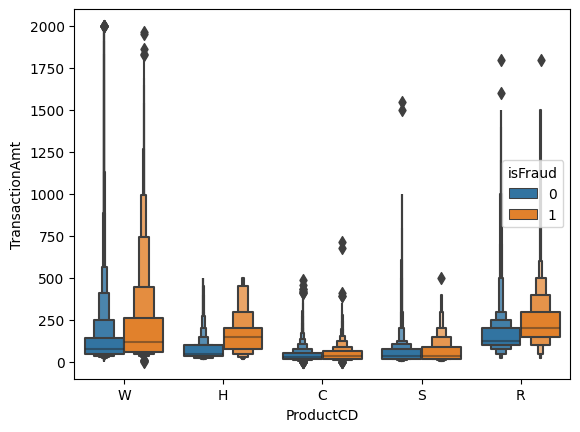

In [31]:
sns.boxenplot(x='ProductCD', y='TransactionAmt', hue='isFraud', 
              data=train_transaction_df[train_transaction_df['TransactionAmt'] <= 2000] )

###### Inference: 
- W, C, R are the most frequent values
- W, H, and R have more distribution of Fraud datasets compared to non-Fraud datasets

###  Lets understand Card Features

In [32]:
credit_card_cols = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']
tabualar_info(train_transaction_df, columns=credit_card_cols)

Shape of dataframe: (590540, 6)


,Name,dtype,UniqueCount,NullValues,NullPercent
0,card1,int64,13553,0,0.000000
1,card2,float64,500,8933,1.512683
2,card3,float64,114,1565,0.265012
3,card4,object,4,1577,0.267044
4,card5,float64,119,4259,0.721204
5,card6,object,4,1571,0.266028


In [33]:
numerical_card_cols = ['card1', 'card2', 'card3', 'card5']
train_transaction_df[numerical_card_cols].quantile(QUANTILE_VALUES)

,card1,card2,card3,card5
0.001,1039.0,100.0,102.0,100.0
0.010,1338.0,100.0,144.0,102.0
0.100,2803.0,111.0,150.0,126.0
0.025,1675.0,111.0,150.0,102.0
0.500,9678.0,361.0,150.0,226.0
0.750,14184.0,512.0,150.0,226.0
0.800,15111.0,543.0,150.0,226.0
0.900,16582.1,555.0,150.0,226.0
0.990,18238.0,583.0,185.0,226.0
0.995,18269.0,588.0,185.0,228.0


In [34]:
import warnings
warnings.filterwarnings('ignore')

In [35]:
train_transaction_df.loc[train_transaction_df.card3.isin(train_transaction_df.card3.value_counts()[train_transaction_df.card3.value_counts() < 200].index), 'card3'] = "Others"
train_transaction_df.loc[train_transaction_df.card5.isin(train_transaction_df.card5.value_counts()[train_transaction_df.card5.value_counts() < 300].index), 'card5'] = "Others"



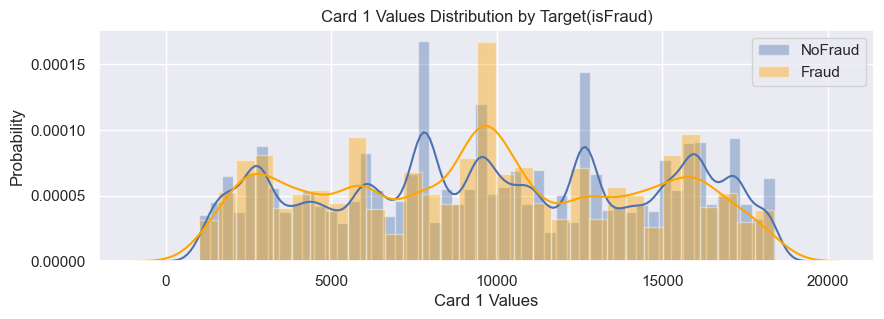

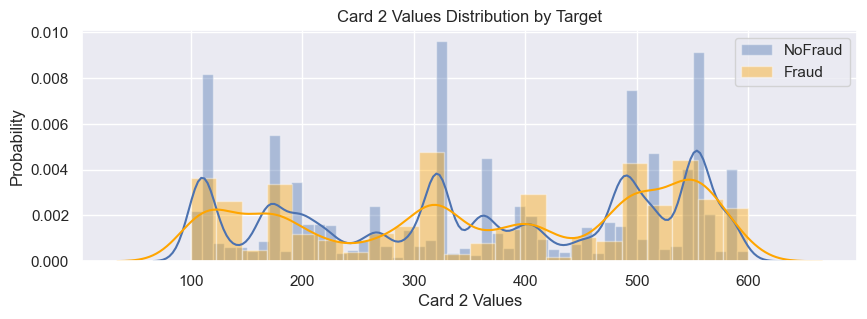

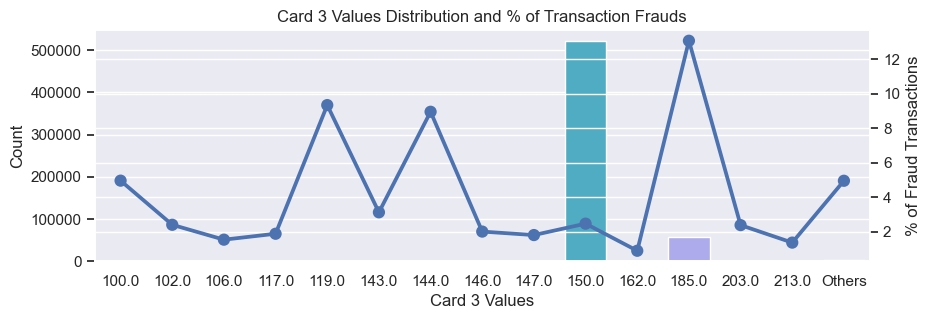

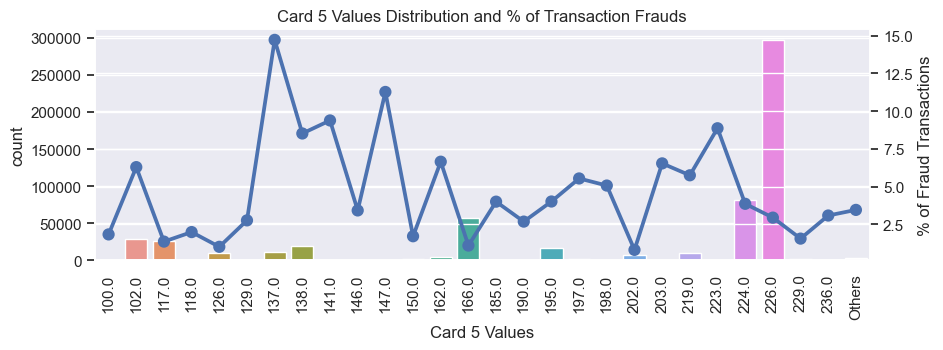

In [36]:
sns.set(rc={'figure.figsize':(10, 3)})

t1 = pd.crosstab(train_transaction_df['card3'], train_transaction_df['isFraud'], normalize='index') * 100
t1 = t1.reset_index()
t1.rename(columns={0: 'NotFraud', 1: 'Fraud'}, inplace=True)

t2 = pd.crosstab(train_transaction_df['card5'], train_transaction_df['isFraud'], normalize='index') * 100
t2 = t2.reset_index()
t2.rename(columns={0: 'NotFraud', 1: 'Fraud'}, inplace=True)

ax = sns.distplot(train_transaction_df[train_transaction_df['isFraud'] == 0]['card1'], label='NoFraud')
ax = sns.distplot(train_transaction_df[train_transaction_df['isFraud'] == 1]['card1'], label='Fraud', color='orange')
ax.legend()
ax.set_title("Card 1 Values Distribution by Target(isFraud)")
ax.set_xlabel("Card 1 Values")
ax.set_ylabel("Probability")
plt.show()

d2 = sns.distplot(train_transaction_df[train_transaction_df['isFraud'] == 0]['card2'].dropna(), label='NoFraud')
d2 = sns.distplot(train_transaction_df[train_transaction_df['isFraud'] == 1]['card2'].dropna(), label='Fraud', color='orange')
d2.legend()
d2.set_title("Card 2 Values Distribution by Target")
d2.set_xlabel("Card 2 Values")
d2.set_ylabel("Probability")
plt.show()

g2 = sns.countplot(x='card3', data=train_transaction_df, order=list(t1.card3.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='card3', y='Fraud', data=t1, order=list(t1.card3.values))
gg2.set_ylabel("% of Fraud Transactions")
g2.set_title("Card 3 Values Distribution and % of Transaction Frauds")
g2.set_xlabel("Card 3 Values")
g2.set_ylabel("Count")
plt.show()

g3 = sns.countplot(x='card5', data=train_transaction_df, order=list(t2.card5.values))
g3t = g3.twinx()
g3t = sns.pointplot(x='card5', y='Fraud', data=t2, order=list(t2.card5.values))
g3t.set_ylabel("% of Fraud Transactions")
g3.set_title("Card 5 Values Distribution and % of Transaction Frauds")
g3.set_xticklabels(g3.get_xticklabels(),rotation=90)
g3.set_xlabel("Card 5 Values")
plt.show()



### Card4 Distribution

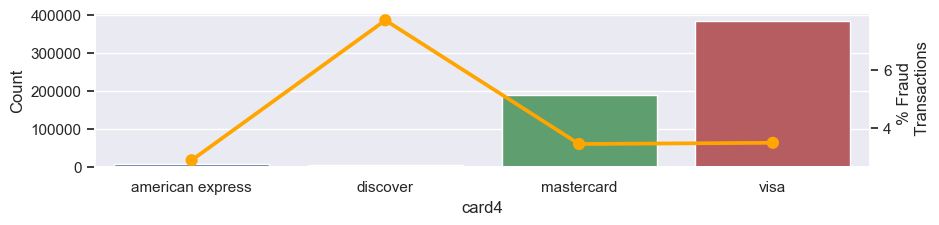

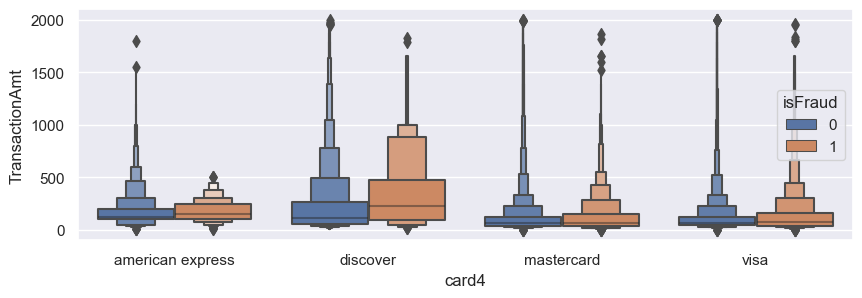

In [37]:
plt.figure(figsize=(10, 2))

cross_tab = pd.crosstab(train_transaction_df['card4'], train_transaction_df['isFraud'], normalize='index') * 100
cross_tab = cross_tab.reset_index()
cross_tab.rename(columns={0: 'Not Fraud', 1: 'Fraud'}, inplace=True)
category_order = list(cross_tab.card4.values)

ax1 = sns.countplot(x='card4', data=train_transaction_df, order=category_order)
ax1.set_ylabel('Count')
ax2 = ax1.twinx()
sns.pointplot(x='card4', y='Fraud', data=cross_tab, color='orange', ax=ax2, order=category_order)
ax2.set_ylabel('% Fraud \n Transactions')
ax2.grid(False)
plt.show()

sns.boxenplot(x='card4', y='TransactionAmt', hue='isFraud', \
              data=train_transaction_df[train_transaction_df['TransactionAmt'] < 2000],\
              order=category_order)

plt.show()

### Card 6 distribution

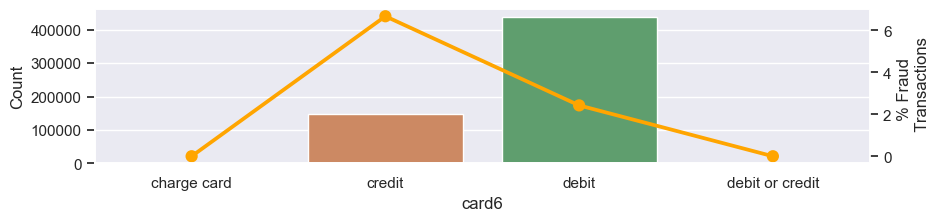

In [38]:
plt.figure(figsize=(10, 2))

cross_tab = pd.crosstab(train_transaction_df['card6'], train_transaction_df['isFraud'], normalize='index') * 100
cross_tab = cross_tab.reset_index()
cross_tab.rename(columns={0: 'Not Fraud', 1: 'Fraud'}, inplace=True)
category_order = list(cross_tab.card6.values)

ax1 = sns.countplot(x='card6', data=train_transaction_df, order=category_order)
ax1.set_ylabel('Count')
ax2 = ax1.twinx()
sns.pointplot(x='card6', y='Fraud', data=cross_tab, color='orange', ax=ax2, order=category_order)
ax2.set_ylabel('% Fraud \n Transactions')
ax2.grid(False)
plt.show()

# sns.boxenplot(x='card6', y='TransactionAmt', hue='isFraud', \
#               data=train_transaction_df[train_transaction_df['TransactionAmt'] < 2000])

plt.show()

#### Inference
- It can be noted that the fraud occurred most in the credit category
- Discover card has more number of fradualant transactions
- Card 4 maps to credit card company
- Card 6 is type of card

### M Distribution
Let's explore what M1 -  M9 values represent

In [39]:
m_cols = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']

In [40]:
for col in m_cols:
    train_transaction_df[col] = train_transaction_df[col].fillna('Unavailable')

In [41]:
def get_impact(feature, target, amount, legend, rotate_xtick=None, figsize=None):
    cross_tab = pd.crosstab(train_transaction_df[feature], train_transaction_df[target], normalize='index') * 100
    cross_tab = cross_tab.reset_index()
    cross_tab.rename(columns=legend, inplace=True)
    category_order = list(cross_tab[feature].values)
    figsize = figsize if figsize else (8,2)
    
    plt.figure(figsize=figsize)
    if rotate_xtick:
        plt.xticks(rotation=rotate_xtick)

    ax1 = sns.countplot(x=feature, data=train_transaction_df, order=category_order)
    ax1.set_ylabel('Count')
    ax1.set_title(f'{feature} by Target ({target})')
    ax2 = ax1.twinx()
    sns.pointplot(x=feature, y='Fraud', data=cross_tab, color='orange', ax=ax2, order=category_order)
    ax2.set_ylabel('% Fraud \n Transactions')
    ax2.grid(False)
    plt.show()
    
    if rotate_xtick:
        plt.xticks(rotation=rotate_xtick)
    
    figsize = figsize if figsize else (8,2)
    
    ax3 = sns.boxenplot(x=feature, y='TransactionAmt', hue=target, \
                  data=train_transaction_df[train_transaction_df['TransactionAmt'] < 2000], order=category_order)
    ax3.set_title(f"TransactionAmt distribution by Target ({target})")
#     print(train_transaction_df[feature].value_counts())
    plt.show()

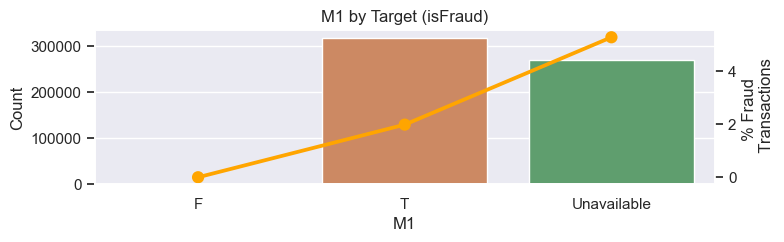

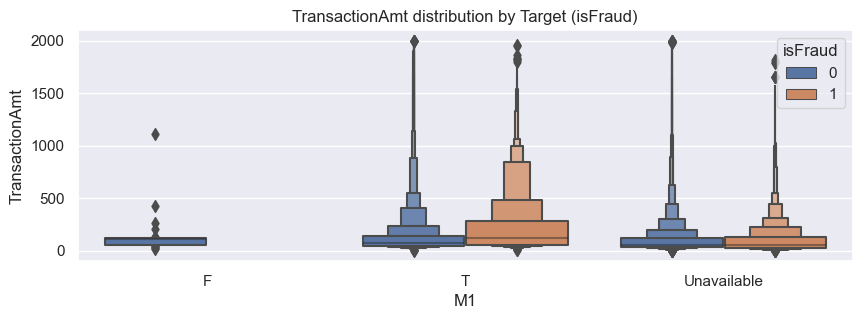

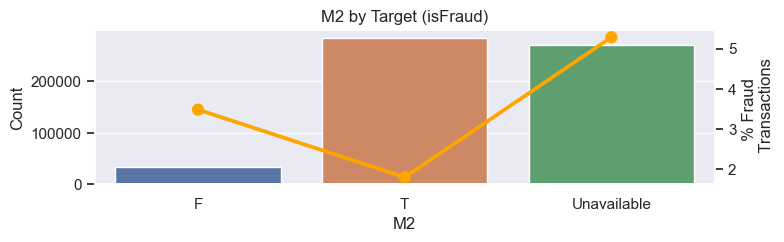

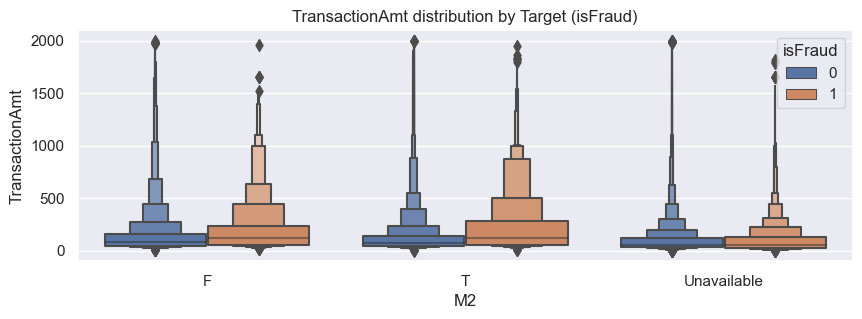

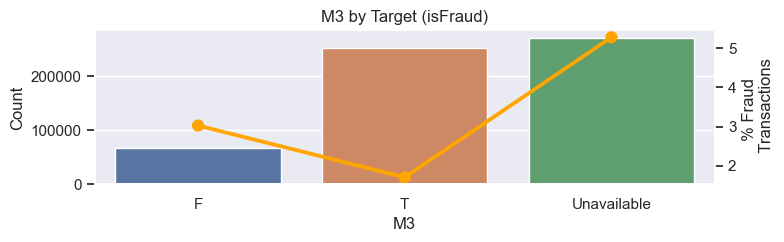

...

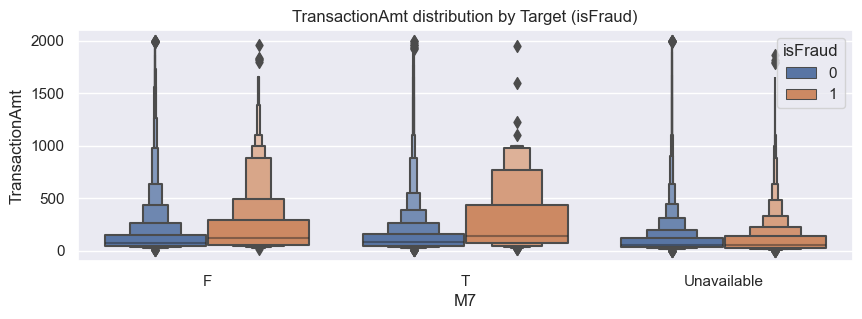

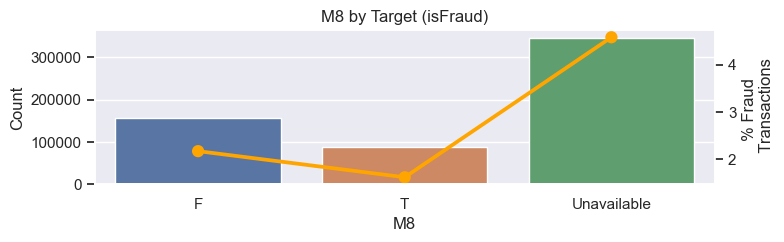

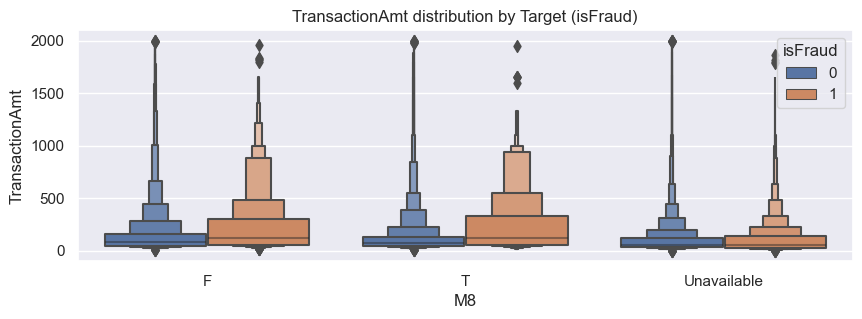

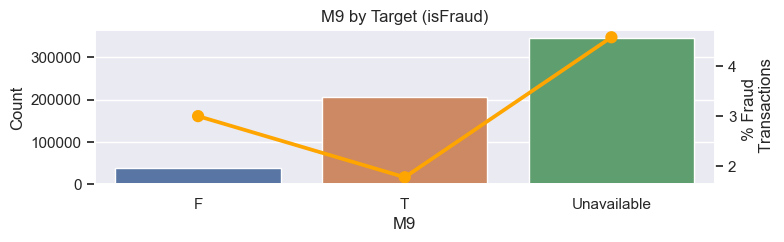

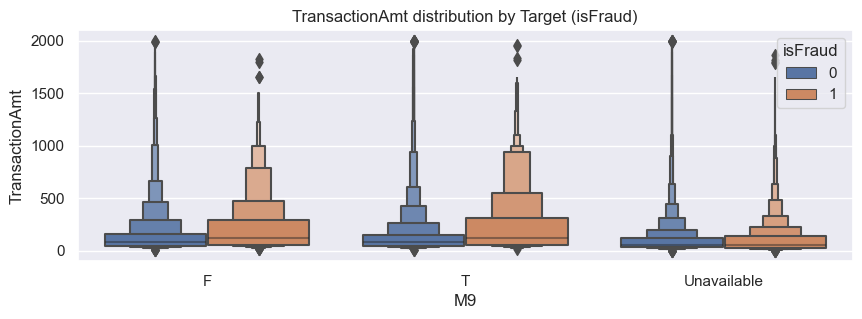

In [42]:
for m_col in m_cols:
    get_impact(feature=m_col, target='isFraud', amount=2000, legend={0: 'Not Fraud', 1: 'Fraud'})

### Let's understand C1 - C14 features

In [43]:
C_Cols = ['C1', 'C2', 'C3', 'C4',  'C5',   'C6',
          'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']
print(tabualar_info(train_transaction_df, columns=C_Cols))
print("\nQuantiles")
print(train_transaction_df[C_Cols].quantile(QUANTILE_VALUES).T)
print("\n Describe")
print(train_transaction_df[C_Cols].describe().T)

Shape of dataframe: (590540, 14)
   Name    dtype  UniqueCount  NullValues  NullPercent
0    C1  float64         1657           0          0.0
1    C2  float64         1216           0          0.0
2    C3  float64           27           0          0.0
3    C4  float64         1260           0          0.0
4    C5  float64          319           0          0.0
5    C6  float64         1328           0          0.0
6    C7  float64         1103           0          0.0
7    C8  float64         1253           0          0.0
8    C9  float64          205           0          0.0
9   C10  float64         1231           0          0.0
10  C11  float64         1476           0          0.0
11  C12  float64         1199           0          0.0
12  C13  float64         1597           0          0.0
13  C14  float64         1108           0          0.0

Quantiles
     0.001  0.010  0.100  0.025  0.500  0.750  0.800  0.900  0.990  0.995
C1     1.0    1.0    1.0    1.0    1.0    3.0    3.0    7

<Figure size 800x200 with 0 Axes>

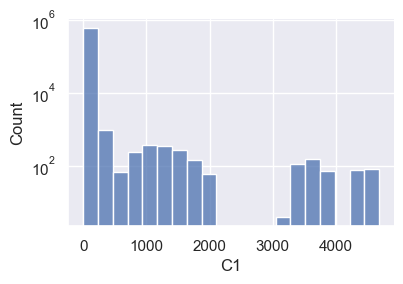

<Figure size 800x200 with 0 Axes>

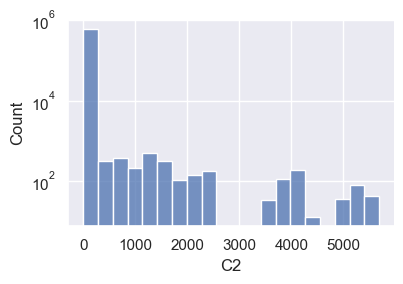

<Figure size 800x200 with 0 Axes>

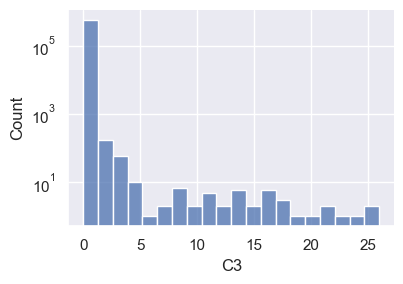

<Figure size 800x200 with 0 Axes>

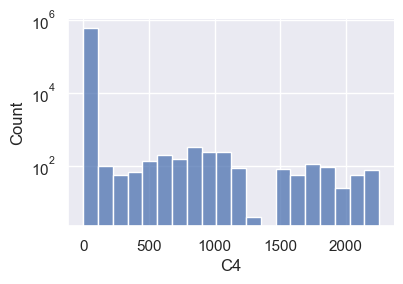

<Figure size 800x200 with 0 Axes>

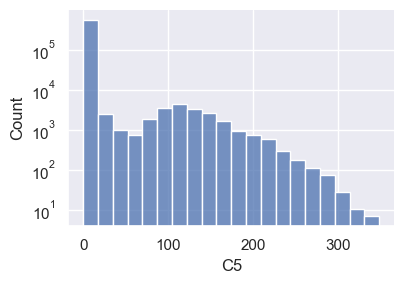

<Figure size 800x200 with 0 Axes>

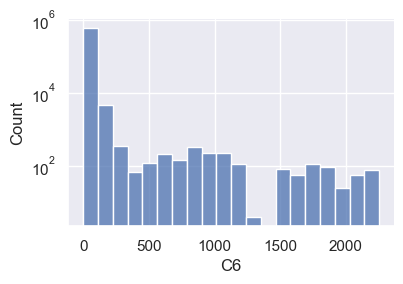

<Figure size 800x200 with 0 Axes>

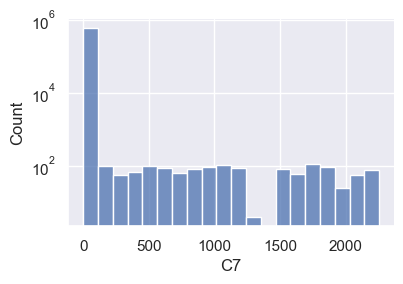

<Figure size 800x200 with 0 Axes>

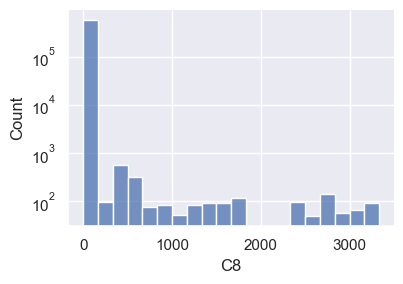

<Figure size 800x200 with 0 Axes>

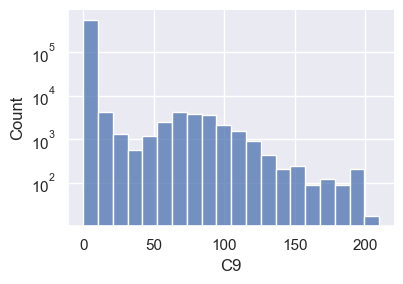

<Figure size 800x200 with 0 Axes>

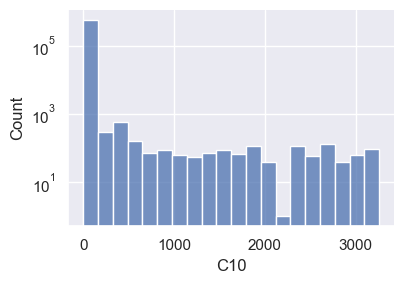

<Figure size 800x200 with 0 Axes>

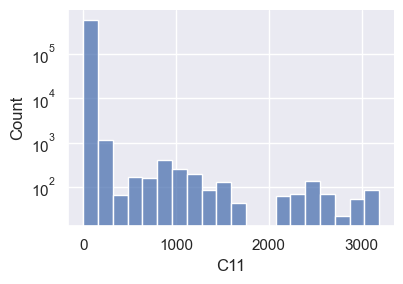

<Figure size 800x200 with 0 Axes>

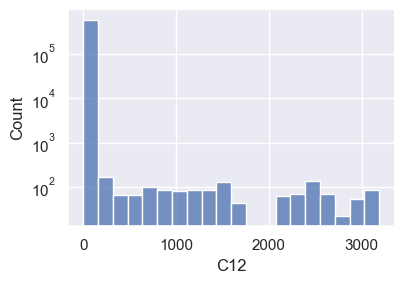

<Figure size 800x200 with 0 Axes>

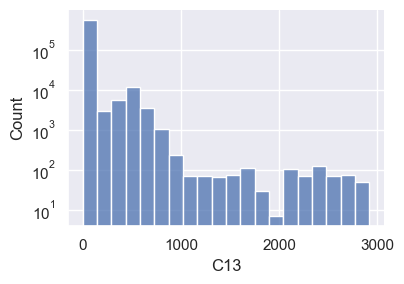

<Figure size 800x200 with 0 Axes>

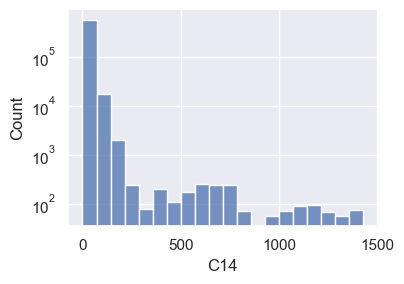

In [44]:
for c_col in C_Cols:
    plt.figure(figsize=(8,2))
    sns.displot(data=train_transaction_df, x=c_col, bins=20, kind='hist', aspect=1.4, height=3, log_scale=(False, True))
    plt.show()

In [45]:
train_transaction_df.C1.value_counts().sort_index()

C1
0.0          494
1.0       316791
2.0       105071
3.0        51315
4.0        28845
5.0        17922
6.0        10567
7.0         7263
8.0         5072
9.0         3612
10.0        2904
11.0        2167
12.0        1965
13.0        1460
14.0        1116
15.0         858
16.0         729
17.0         715
18.0         578
19.0         494
20.0         437
21.0         375
22.0         369
23.0         257
24.0         323
25.0         287
26.0         221
27.0         216
28.0         191
29.0         158
30.0         161
31.0         130
32.0         107
33.0          97
34.0         149
35.0         136
36.0         151
37.0         116
38.0         113
39.0         144
40.0         162
41.0         123
42.0         100
43.0          93
44.0          71
45.0          64
46.0          84
47.0          82
48.0          57
49.0          63
50.0          57
51.0          89
52.0          97
53.0          43
54.0          31
55.0          50
56.0          39
57.0          37
58.0       

### id_12 - id_38

In [46]:
ids = ['id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18',
       'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25',
       'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32',
       'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38']

In [47]:
print(tabualar_info(train_transaction_df, columns=ids))

Shape of dataframe: (590540, 27)
     Name    dtype  UniqueCount  NullValues  NullPercent
0   id_12   object            2      446307    75.576083
1   id_13  float64           54      463220    78.440072
2   id_14  float64           25      510496    86.445626
3   id_15   object            3      449555    76.126088
4   id_16   object            2      461200    78.098012
5   id_17  float64          104      451171    76.399736
6   id_18  float64           18      545427    92.360721
7   id_19  float64          522      451222    76.408372
8   id_20  float64          394      451279    76.418024
9   id_21  float64          490      585381    99.126393
10  id_22  float64           25      585371    99.124699
11  id_23   object            3      585371    99.124699
12  id_24  float64           12      585793    99.196159
13  id_25  float64          341      585408    99.130965
14  id_26  float64           95      585377    99.125715
15  id_27   object            2      585371    99.12469

In [48]:
numeric_ids = list(train_transaction_df[ids].select_dtypes(include=NUMERICS).columns.values)
non_numeric_ids = list(train_transaction_df[ids].select_dtypes(exclude=NUMERICS).columns.values)
print (f'Numeric ID columns: {numeric_ids}')
print (f'Non-Numeric ID columns: {non_numeric_ids}')

Numeric ID columns: ['id_13', 'id_14', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_24', 'id_25', 'id_26', 'id_32']
Non-Numeric ID columns: ['id_12', 'id_15', 'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38']


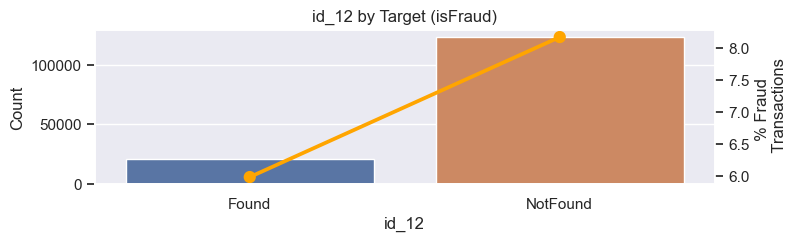

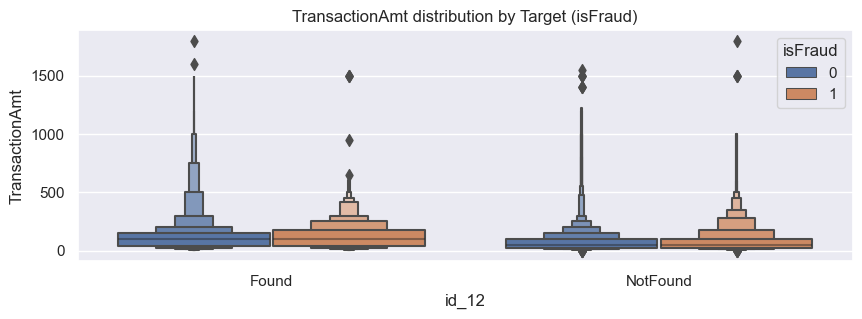

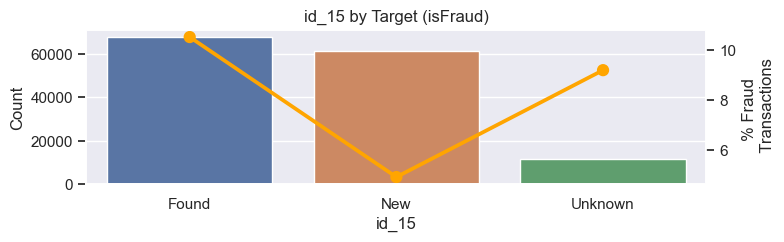

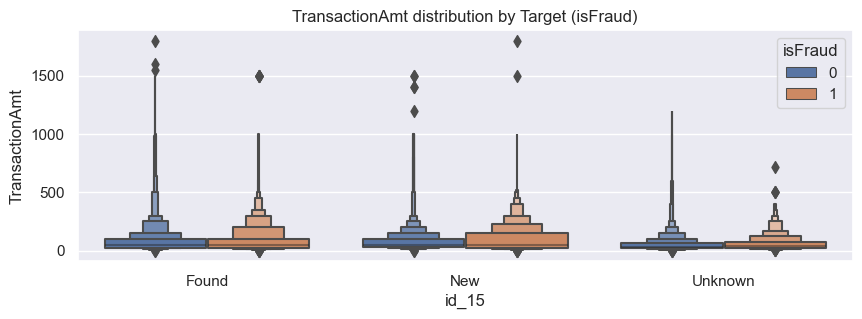

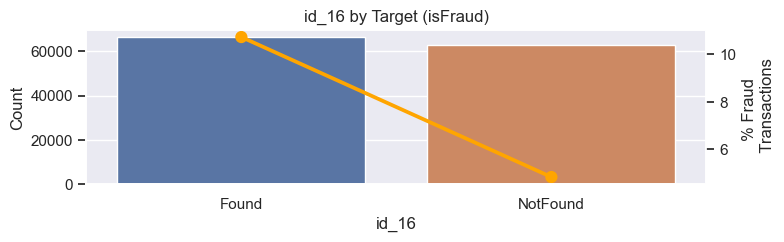

...

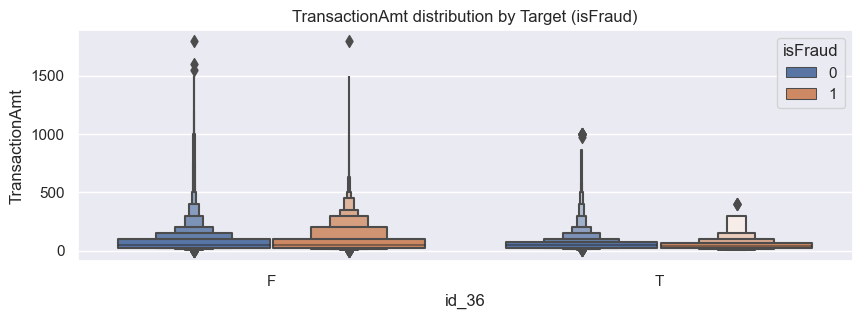

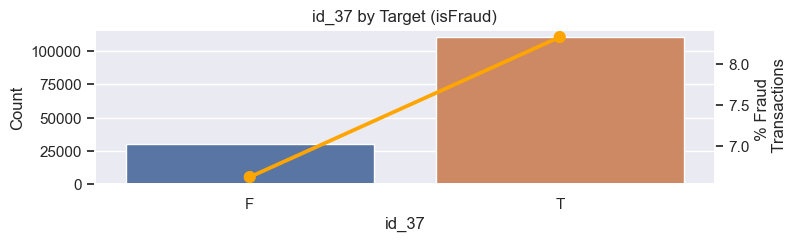

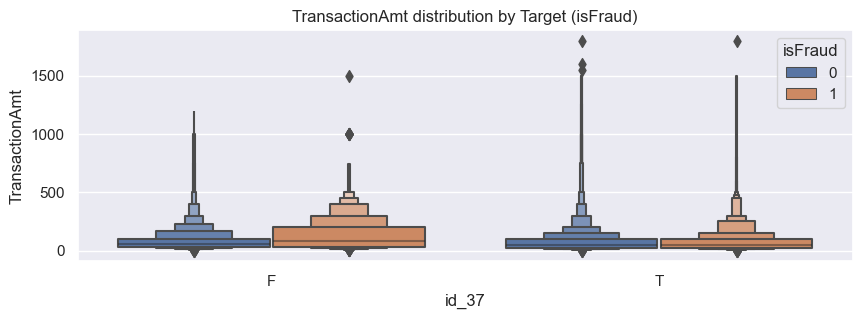

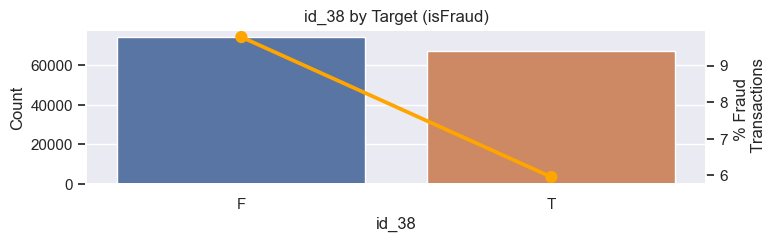

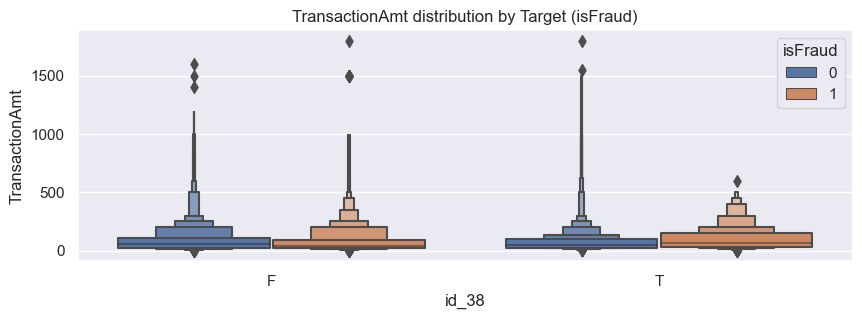

In [49]:
for m_col in non_numeric_ids:
    get_impact(feature=m_col, target='isFraud', amount=2000, legend={0: 'Not Fraud', 1: 'Fraud'})
    

## Hypothesis
1. Is there any correlation betweeen time of the day and fraudulent activities?
2. Is there any correlation betweeen day of week and fraudulent activities?

Let's verify hypothesis

In [50]:
unix_epoch = '1970-01-01'
start_date = datetime.strptime(unix_epoch, '%Y-%m-%d')

train_transaction_df['transaction_date_from_epoch'] = train_transaction_df['TransactionDT']\
                                                        .apply(lambda x: start_date + timedelta(seconds=x))


In [51]:
train_transaction_df['dow'] = train_transaction_df['transaction_date_from_epoch'].dt.dayofweek
train_transaction_df['hour'] = train_transaction_df['transaction_date_from_epoch'].dt.hour
train_transaction_df['day'] = train_transaction_df['transaction_date_from_epoch'].dt.day

In [52]:
# # Hypothesis 1: Is there any correlation betweeen time of the day and fraudulent activities?
# plt.plot(train_transaction_df.groupby('hour').mean()['isFraud'], color='b')
# ax1 = plt.gca()
# ax2 = ax1.twinx()
# _ = ax2.hist(train_transaction_df['hour'], alpha=0.3, bins=24)
# ax1.set_xlabel('Hour')
# ax1.set_ylabel('Fraction of fraudulent transactions')

# ax2.set_ylabel('Number of transactions')

Observation on Hypothesis 1: It looks like fraudalent activities peaks between 4 - 15 hrs. A good feature to keep around and use it in model

In [53]:
# # Hypothesis 2: Is there any correlation betweeen day of week and fraudulent activities?
# plt.plot(train_transaction_df.groupby('day').mean()['isFraud'], color='b')
# ax1 = plt.gca()
# ax2 = ax1.twinx()
# _ = ax2.hist(train_transaction_df['day'], alpha=0.3, bins=31)
# ax1.set_xlabel('Day')
# ax1.set_ylabel('Fraction of fraudulent transactions')

# ax2.set_ylabel('Number of transactions')
# ax2.grid(False)

Observation on Hypothesis 2: Very hard to guage if there is a correaltion here.. Let's see what other data points say

In [54]:
# # Hypothesis 2: Is there any correlation betweeen day of week and fraudulent activities?
# plt.plot(train_transaction_df.groupby('dow').mean()['isFraud'], color='b')
# ax1 = plt.gca()
# ax2 = ax1.twinx()
# _ = ax2.hist(train_transaction_df['dow'], alpha=0.3, bins=7)
# ax1.set_xlabel('dow')
# ax1.set_ylabel('Fraction of fraudulent transactions')

# ax2.set_ylabel('Number of transactions')
# ax2.grid(False)

Observation on Hypothesis 3: Looks like more fraudalent activities from day 1 - 6

##### Conclusion
Looks like day of week and hour of week are the powerful features to include to build models

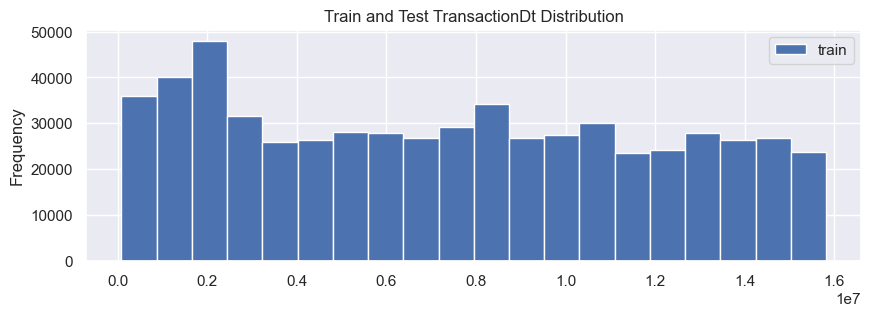

In [55]:

train_transaction_df['TransactionDT'].plot(kind='hist', label='train', bins=20,\
                                           title='Train and Test TransactionDt Distribution')
plt.legend()
plt.show()

In [56]:
email_type = ['P_emaildomain', 'R_emaildomain']
for email in email_type:
    title = f"Value counts for {email}"
    print(title)
    print("-"*len(title))
    print(train_transaction_df[email].value_counts())
    print("\n")

Value counts for P_emaildomain
------------------------------
P_emaildomain
gmail.com           228355
yahoo.com           100934
hotmail.com          45250
anonymous.com        36998
aol.com              28289
comcast.net           7888
icloud.com            6267
outlook.com           5096
msn.com               4092
att.net               4033
live.com              3041
sbcglobal.net         2970
verizon.net           2705
ymail.com             2396
bellsouth.net         1909
yahoo.com.mx          1543
me.com                1522
cox.net               1393
optonline.net         1011
charter.net            816
live.com.mx            749
rocketmail.com         664
mail.com               559
earthlink.net          514
gmail                  496
outlook.es             438
mac.com                436
juno.com               322
aim.com                315
hotmail.es             305
roadrunner.com         305
windstream.net         305
hotmail.fr             295
frontier.com           280
embarq

There are just too many domains. It would be hard to plot this on a graph unless this data is aggregated in some fashion. One way is to group data by big players such as Google, Microsoft, Yahoo etc.

In [57]:
company_to_domain_mapping = {
    "google": ['gmail'],
    "yahoo": ['yahoo', 'ymail'],
    "microsoft": [ 'hotmail', 'aol', 'outlook', 'msn', 'live' ],
    "apple": ['icloud']
}

In [58]:
train_transaction_df['P_emaildomain'].fillna('unavailable', inplace=True)

for company, domains in company_to_domain_mapping.items():
    train_transaction_df.loc[
        train_transaction_df['P_emaildomain'].str.contains('|'.join(domains)), 'P_emaildomain'
    ] = company

In [59]:
train_transaction_df['P_emaildomain'].unique()

array(['unavailable', 'google', 'microsoft', 'yahoo', 'mail.com',
       'anonymous.com', 'verizon.net', 'me.com', 'comcast.net',
       'optonline.net', 'cox.net', 'charter.net', 'rocketmail.com',
       'prodigy.net.mx', 'embarqmail.com', 'apple', 'att.net', 'juno.com',
       'sbcglobal.net', 'bellsouth.net', 'q.com', 'centurylink.net',
       'servicios-ta.com', 'earthlink.net', 'cfl.rr.com',
       'roadrunner.com', 'netzero.net', 'gmx.de', 'suddenlink.net',
       'frontiernet.net', 'windstream.net', 'frontier.com', 'mac.com',
       'netzero.com', 'aim.com', 'web.de', 'twc.com', 'cableone.net',
       'sc.rr.com', 'ptd.net', 'protonmail.com'], dtype=object)

In [60]:
print(tabualar_info(df=train_transaction_df, columns=['P_emaildomain']))
print("\n")
print("Value counts")
print("------------")
print(train_transaction_df['P_emaildomain'].value_counts())

Shape of dataframe: (590540, 1)
            Name   dtype  UniqueCount  NullValues  NullPercent
0  P_emaildomain  object           41           0          0.0


Value counts
------------
P_emaildomain
google              228851
yahoo               105305
unavailable          94456
microsoft            87766
anonymous.com        36998
comcast.net           7888
apple                 6267
att.net               4033
sbcglobal.net         2970
verizon.net           2705
bellsouth.net         1909
me.com                1522
cox.net               1393
optonline.net         1011
charter.net            816
rocketmail.com         664
mail.com               559
earthlink.net          514
mac.com                436
juno.com               322
aim.com                315
roadrunner.com         305
windstream.net         305
frontier.com           280
embarqmail.com         260
web.de                 240
twc.com                230
netzero.com            230
prodigy.net.mx         207
centurylink.net  

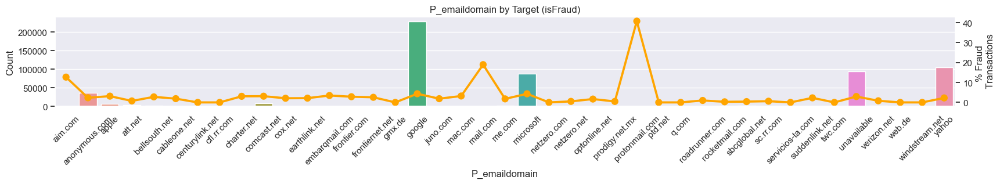

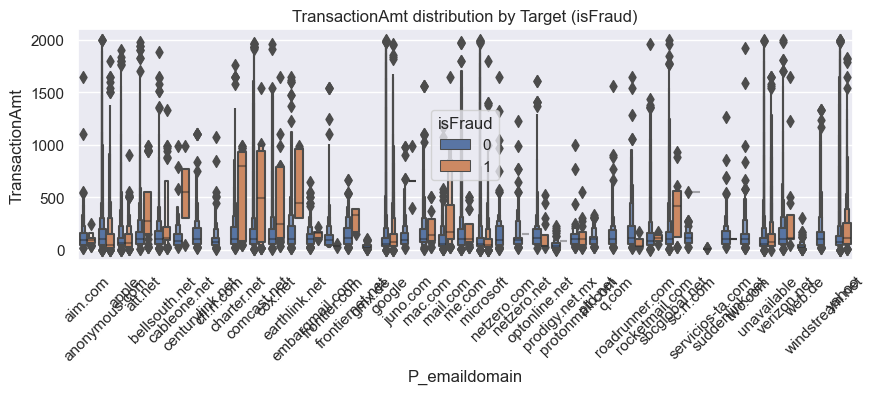

In [61]:

get_impact(feature='P_emaildomain', \
           target='isFraud', amount=2000, \
           legend={0: 'Not Fraud', 1: 'Fraud'}, rotate_xtick=45, figsize = (20,2))


In [62]:
print(tabualar_info(df=train_transaction_df, columns=['R_emaildomain']))
print("\n")
print("Value counts")
print("------------")
print(train_transaction_df['R_emaildomain'].value_counts())

Shape of dataframe: (590540, 1)
            Name   dtype  UniqueCount  NullValues  NullPercent
0  R_emaildomain  object           60      453249    76.751617


Value counts
------------
R_emaildomain
gmail.com           57147
hotmail.com         27509
anonymous.com       20529
yahoo.com           11842
aol.com              3701
outlook.com          2507
comcast.net          1812
yahoo.com.mx         1508
icloud.com           1398
msn.com               852
live.com              762
live.com.mx           754
verizon.net           620
me.com                556
sbcglobal.net         552
cox.net               459
outlook.es            433
att.net               430
bellsouth.net         422
hotmail.fr            293
hotmail.es            292
web.de                237
mac.com               218
ymail.com             207
prodigy.net.mx        207
optonline.net         187
gmx.de                147
yahoo.fr              137
charter.net           127
mail.com              122
hotmail.co.uk       

In [63]:
train_transaction_df['R_emaildomain'].fillna('unavailable', inplace=True)

for company, domains in company_to_domain_mapping.items():
    train_transaction_df.loc[
        train_transaction_df['R_emaildomain'].str.contains('|'.join(domains)), 'R_emaildomain'
    ] = company

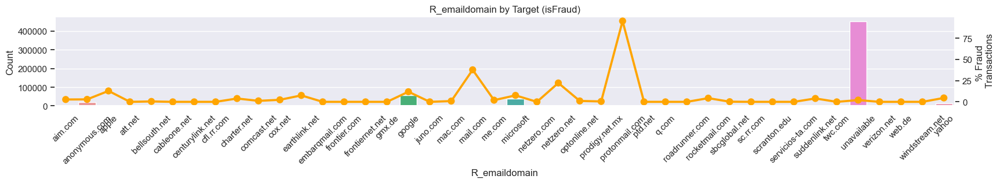

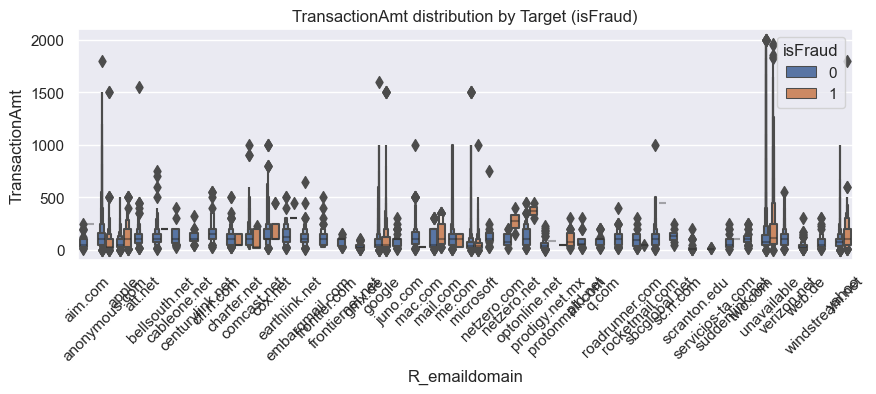

In [64]:

get_impact(feature='R_emaildomain', \
           target='isFraud', amount=2000, \
           legend={0: 'Not Fraud', 1: 'Fraud'}, rotate_xtick=45, figsize = (20,2))


### Modeling

In [65]:
%%time
train_transaction_df = pd.read_csv('ieee-fraud-detection-data/train_transaction.csv')
train_identity_df = pd.read_csv('ieee-fraud-detection-data/train_identity.csv')


test_identity_df = pd.read_csv('ieee-fraud-detection-data/test_identity.csv')

CPU times: user 18.3 s, sys: 9.54 s, total: 27.8 s
Wall time: 29 s


In [66]:
%%time
train_transaction_df = train_transaction_df.merge(train_identity_df, on='TransactionID', how='left')


CPU times: user 1.17 s, sys: 1.5 s, total: 2.67 s
Wall time: 2.68 s


In [67]:
train_transaction_size_GB = train_transaction_df.memory_usage().sum()/(1024**3)

print(f"Shape of Train Dataset with identity dataframe {train_transaction_df.shape}")

print(f"Memory Usage for Training Dataset {round(train_transaction_size_GB, 4)} GB")


Shape of Train Dataset with identity dataframe (590540, 434)
Memory Usage for Training Dataset 1.9095 GB


In [68]:
del train_identity_df

### Feature Engineering

In [69]:
train_transaction_df['TransactionAmt_to_mean_card1'] = train_transaction_df['TransactionAmt'] / train_transaction_df.groupby(['card1'])['TransactionAmt'].transform('mean')
train_transaction_df['TransactionAmt_to_mean_card4'] = train_transaction_df['TransactionAmt'] / train_transaction_df.groupby(['card4'])['TransactionAmt'].transform('mean')
# train_transaction_df['TransactionAmt_to_std_card1'] = train_transaction_df['TransactionAmt'] / train_transaction_df.groupby(['card1'])['TransactionAmt'].transform('std')
train_transaction_df['TransactionAmt_to_std_card4'] = train_transaction_df['TransactionAmt'] / train_transaction_df.groupby(['card4'])['TransactionAmt'].transform('std')

train_transaction_df['id_02_to_mean_card1'] = train_transaction_df['id_02'] / train_transaction_df.groupby(['card1'])['id_02'].transform('mean')
train_transaction_df['id_02_to_mean_card4'] = train_transaction_df['id_02'] / train_transaction_df.groupby(['card4'])['id_02'].transform('mean')
train_transaction_df['id_02_to_std_card1'] = train_transaction_df['id_02'] / train_transaction_df.groupby(['card1'])['id_02'].transform('std')
train_transaction_df['id_02_to_std_card4'] = train_transaction_df['id_02'] / train_transaction_df.groupby(['card4'])['id_02'].transform('std')

train_transaction_df['D15_to_mean_card1'] = train_transaction_df['D15'] / train_transaction_df.groupby(['card1'])['D15'].transform('mean')
train_transaction_df['D15_to_mean_card4'] = train_transaction_df['D15'] / train_transaction_df.groupby(['card4'])['D15'].transform('mean')
# train_transaction_df['D15_to_std_card1'] = train_transaction_df['D15'] / train_transaction_df.groupby(['card1'])['D15'].transform('std')
train_transaction_df['D15_to_std_card4'] = train_transaction_df['D15'] / train_transaction_df.groupby(['card4'])['D15'].transform('std')

train_transaction_df['D15_to_mean_addr1'] = train_transaction_df['D15'] / train_transaction_df.groupby(['addr1'])['D15'].transform('mean')
train_transaction_df['D15_to_mean_addr2'] = train_transaction_df['D15'] / train_transaction_df.groupby(['addr2'])['D15'].transform('mean')
# train_transaction_df['D15_to_std_addr1'] = train_transaction_df['D15'] / train_transaction_df.groupby(['addr1'])['D15'].transform('std')
train_transaction_df['D15_to_std_addr2'] = train_transaction_df['D15'] / train_transaction_df.groupby(['addr2'])['D15'].transform('std')

train_transaction_df[['P_emaildomain_1', 'P_emaildomain_2', 'P_emaildomain_3']] = train_transaction_df['P_emaildomain'].str.split('.', expand=True)
train_transaction_df[['R_emaildomain_1', 'R_emaildomain_2', 'R_emaildomain_3']] = train_transaction_df['R_emaildomain'].str.split('.', expand=True)


In [70]:
train_null_cols = [col for col in train_transaction_df.columns if \
                  train_transaction_df[col].isnull().sum() / train_transaction_df.shape[0] > 0.9]

one_value_cols = [col for col in train_transaction_df.columns if train_transaction_df[col].nunique() <= 1]

big_top_value_cols_train = [col for col in train_transaction_df.columns if \
                      train_transaction_df[col].value_counts(dropna=False, normalize=True).values[0] > 0.9]


In [71]:
cols_to_drop = list(set(train_null_cols  +  one_value_cols + big_top_value_cols_train ))
cols_to_drop.remove('isFraud')
len(cols_to_drop)

68

In [72]:
train_transaction_df = train_transaction_df.drop(cols_to_drop, axis=1)

In [73]:
non_numeric_cols = list(train_transaction_df.select_dtypes(exclude=NUMERICS).columns.values)

In [74]:
%%time
for col in non_numeric_cols:
    if col in train_transaction_df.columns:
        le = LabelEncoder()
        le.fit(list(train_transaction_df[col].astype(str).values))
        train_transaction_df[col] = le.transform(list(train_transaction_df[col].astype(str).values))

CPU times: user 21.5 s, sys: 568 ms, total: 22 s
Wall time: 22.2 s


In [75]:
# split the dataset into the training set and test set
from sklearn.model_selection import train_test_split

X = train_transaction_df.drop('isFraud', axis=1)
y = train_transaction_df['isFraud']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [76]:
!pip install lightgbm

In [77]:
import lightgbm as lgb
clf = lgb.LGBMClassifier()
clf.fit(X_train, y_train)

LGBMClassifier()

In [78]:
y_pred=clf.predict(X_test)

In [79]:
# view accuracy
from sklearn.metrics import accuracy_score
accuracy=accuracy_score(y_pred, y_test)
print('LightGBM Model accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

LightGBM Model accuracy score: 0.9787


In [80]:
y_pred_train = clf.predict(X_train)

In [81]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.9795


In [82]:
# Check for overfitting

print('Training set score: {:.4f}'.format(clf.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(clf.score(X_test, y_test)))

Training set score: 0.9795
Test set score: 0.9787


<Axes: >

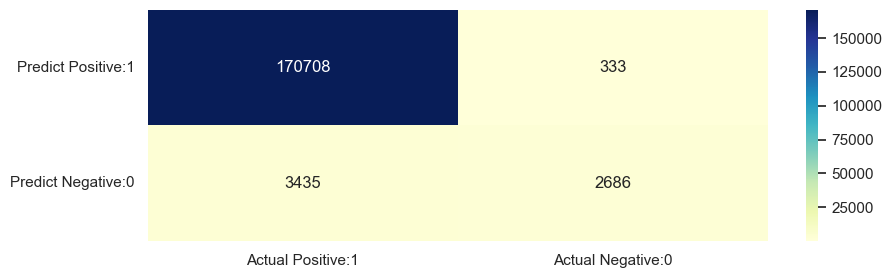

In [83]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [84]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    171041
           1       0.89      0.44      0.59      6121

    accuracy                           0.98    177162
   macro avg       0.93      0.72      0.79    177162
weighted avg       0.98      0.98      0.98    177162



#### Parameters
- num_leaves (int, optional (default=31)) – Maximum tree leaves for base learners.
- min_child_samples (int, optional (default=20)) – Minimum number of data needed in a child (leaf).
- objective (str, callable or None, optional (default=None)) – Specify the learning task and the corresponding learning objective or a custom objective function to be used (see note below).
- max_depth (int, optional (default=-1)) – Maximum tree depth for base learners, <=0 means no limit.
- learning_rate (float, optional (default=0.1)) – Boosting learning rate
- boosting_type (str, optional (default='gbdt')) – ‘gbdt’, traditional Gradient Boosting Decision Tree. ‘dart’, Dropouts meet Multiple Additive Regression Trees. ‘rf’, Random Forest.
- subsample_freq (int, optional (default=0)) – Frequency of subsample, <=0 means no enable.
- reg_alpha (float, optional (default=0.)) – L1 regularization term on weights.
- reg_lambda (float, optional (default=0.)) – L2 regularization term on weights.
- colsample_bytree (float, optional (default=1.)) – Subsample ratio of columns when constructing each tree.
- n_estimators (int, optional (default=100)) – Number of boosted trees to fit.
- n_jobs (int or None, optional (default=None)) – Number of parallel threads to use for training 

In [85]:
params = {'num_leaves': 256,
          'min_child_samples': 79,
          'objective': 'binary',
          'max_depth': 13,
          'learning_rate': 0.03,
          "boosting_type": "gbdt",
          "subsample_freq": 3,
          "subsample": 0.9,
          "bagging_seed": 11,
          "metric": 'auc',
          "verbosity": -1,
          'reg_alpha': 0.3,
          'reg_lambda': 0.3,
          'colsample_bytree': 0.9
         }

In [86]:
model = lgb.LGBMClassifier(**params, n_estimators=50000, n_jobs = -1)

model.fit(X_train, y_train)

LGBMClassifier(bagging_seed=11, colsample_bytree=0.9, learning_rate=0.03,
               max_depth=13, metric='auc', min_child_samples=79,
               n_estimators=50000, num_leaves=256, objective='binary',
               reg_alpha=0.3, reg_lambda=0.3, subsample=0.9, subsample_freq=3,
               verbosity=-1)

In [87]:
y_pred_test_with_params = model.predict(X_test)

<Axes: >

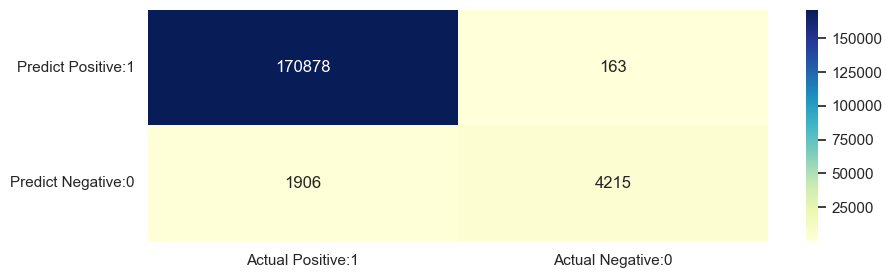

In [88]:
cm = confusion_matrix(y_test, y_pred_test_with_params)
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [89]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_test_with_params))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    171041
           1       0.96      0.69      0.80      6121

    accuracy                           0.99    177162
   macro avg       0.98      0.84      0.90    177162
weighted avg       0.99      0.99      0.99    177162

